### Computer Vision Course (Spring 2023)
Instructor: Imad Eddine Ibrahim BEKKOUCH \\
TA: Batoul Yaseen


### Acknowledgement
This lab was maintained by Batoul, Karam, Rufina, Alex and Fahim \\

This lab was created by: Rauf \\
Email: goodraff@gmail.com \\
Links: [github](https://github.com/RocketFlash) , [LinkedIn](https://www.linkedin.com/in/rocketflash/)


### Lab Objectives

1. Point Operations
2. Neighborhood Operation
3. Geometric Operation



## Preparations

In [1]:
# Import libraries
# all plots will be set directly below the code cell that produced it
%matplotlib inline
from matplotlib import pyplot as plt
# set inline plots size
plt.rcParams["figure.figsize"] = (22.5, 10.5) # (w, h)
import numpy as np
import cv2

### Download images

In [2]:
# !wget "https://images.unsplash.com/photo-1578133630261-a79a92922335?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1000&q=80" -O dog.jpg
# !wget "https://images.unsplash.com/photo-1514924013411-cbf25faa35bb?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1000&q=80" -O city.jpg

### Check downloaded images

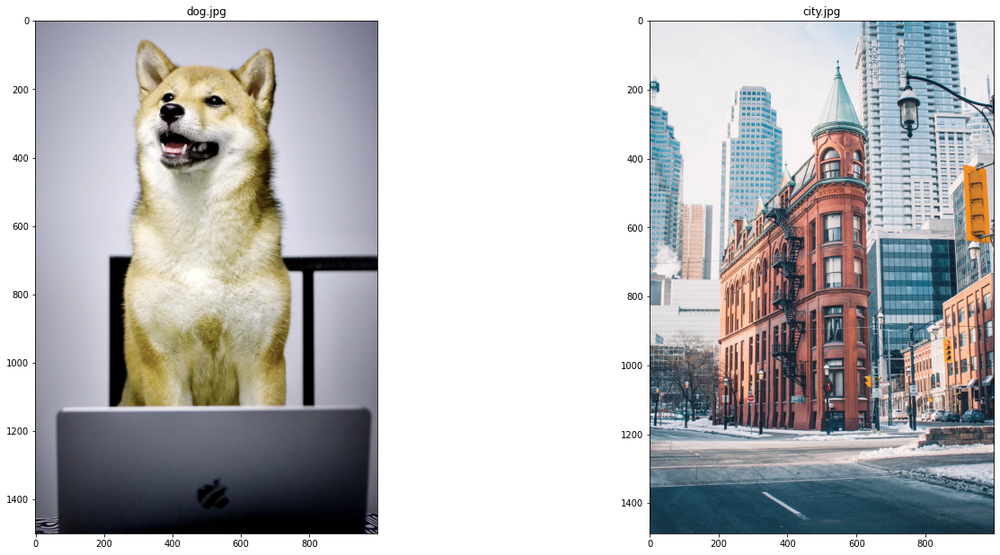

In [3]:
dog_bgr = cv2.imread("dog.jpg", cv2.IMREAD_COLOR)
dog_gray = cv2.cvtColor(dog_bgr, cv2.COLOR_BGR2GRAY) 
dog_rgb = cv2.cvtColor(dog_bgr, cv2.COLOR_BGR2RGB)

city_bgr = cv2.imread("city.jpg", cv2.IMREAD_COLOR)
city_gray = cv2.cvtColor(city_bgr, cv2.COLOR_BGR2GRAY)
city_rgb = cv2.cvtColor(city_bgr, cv2.COLOR_BGR2RGB)

# Matplotlib allows you display images in a row
# To do this, you need to generate subplots
# plt.subplot(number_of_rows, number_of_columns, index)
subplot = plt.subplot(1, 2, 1)
subplot.set_title("dog.jpg")
subplot.imshow(dog_rgb)


subplot = plt.subplot(1, 2, 2)
subplot.set_title("city.jpg")
subplot.imshow(city_rgb)


# After the subplots were filled, just call plt.show()
plt.show()

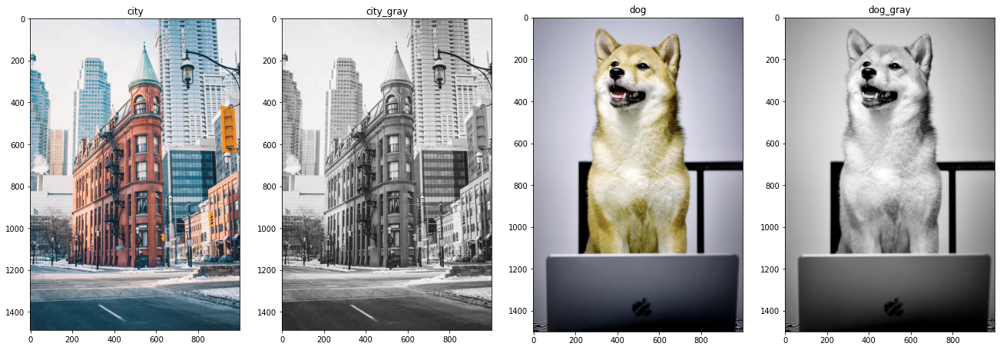

In [4]:
# Let's make our lives easier
def showInRow(list_of_images, titles = None):
  count = len(list_of_images)
  for idx in range(count):
    subplot = plt.subplot(1, count, idx+1)
    if titles is not None:
      subplot.set_title(titles[idx])
      
    img = list_of_images[idx]
    cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
    subplot.imshow(img, cmap=cmap)
  plt.show()
  
  
showInRow([city_rgb, city_gray, dog_rgb, dog_gray], ['city', 'city_gray', 'dog', 'dog_gray'])

## Point operations
Point operations are performed for each pixel separately

![alt text](https://drive.google.com/uc?export=view&id=1IpvyAX-OnRD3pdQmCCK0qZMoZOA5GZe2)

One of the simplest operations is inverting an image.

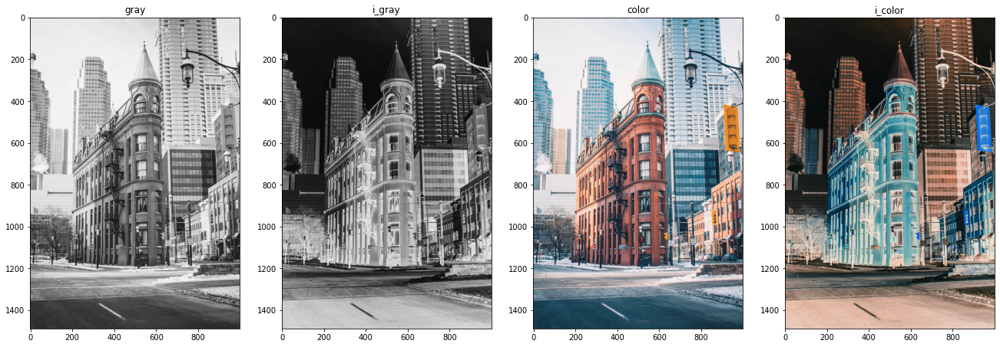

In [5]:
# Invert in grayscale
city_gray_inverted = 255 - city_gray


# In RGB colorspace
img_r,img_g,img_b = cv2.split(city_rgb)
negative_r = (255-img_r)
negative_g = (255-img_g)
negative_b = (255-img_b)
negative_rgb = cv2.merge((negative_r,negative_g,negative_b))


showInRow([city_gray, city_gray_inverted, city_rgb, negative_rgb], ["gray", "i_gray", "color", "i_color"])

### Exercise
Invert the blue channel of the city image by yourself

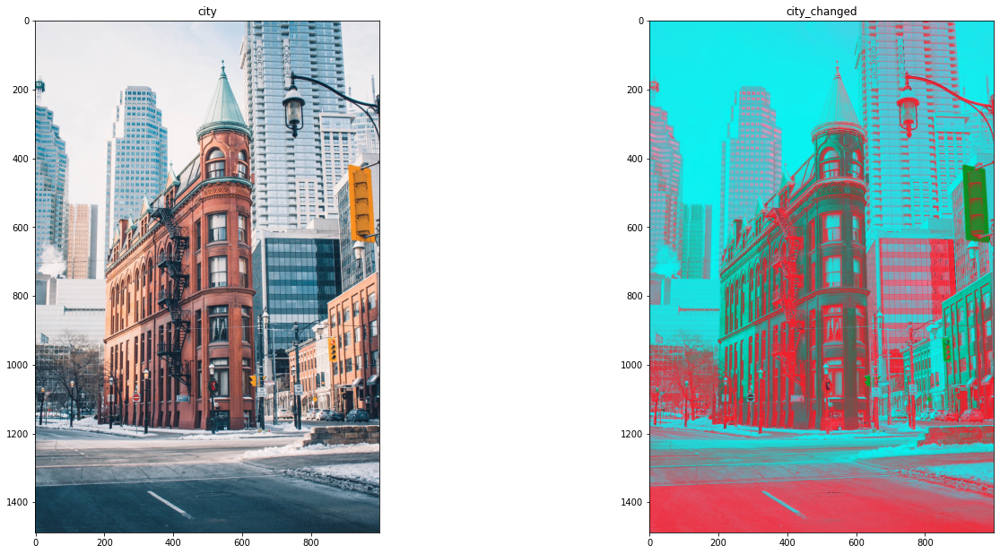

In [18]:
city_rgb_changed = city_rgb.copy()

city_rgb_changed[:,:,0] = 1 - city_rgb_changed[:,:,0]

showInRow([city_rgb, city_rgb_changed], ["city", "city_changed"])


### Vignetting(exercise)
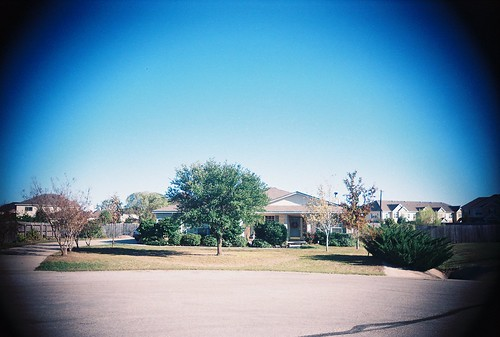

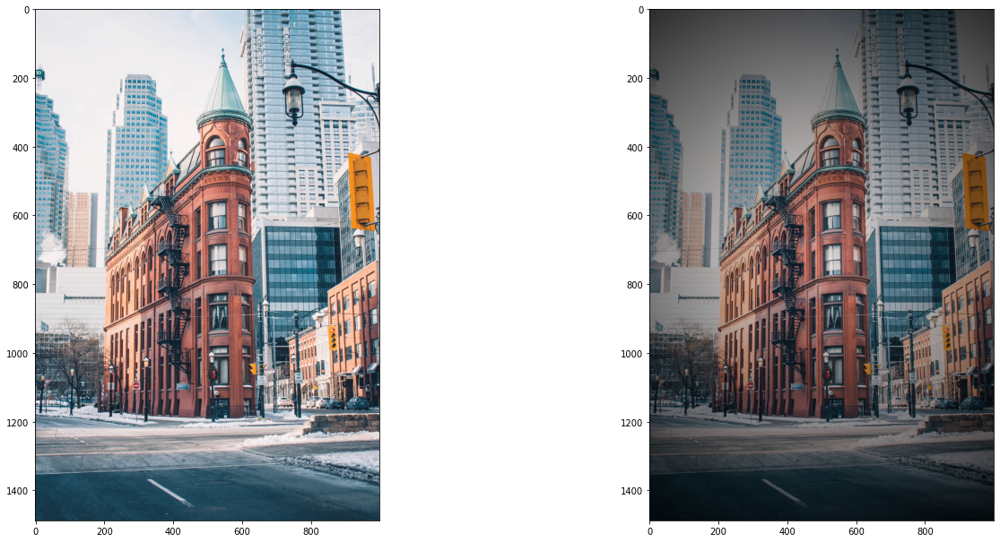

In [29]:
# Vignetting should reduce the brightness of the image toward the periphery compared to the image center.

def Vignetting(img, decay = 0.5):
  result_img = np.zeros_like(img)
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      dist = ((i - img.shape[0]//2)**2+(j - img.shape[1]//2)**2)**(1/2)
      result_img[i][j] = img[i][j] * (1 - decay * dist/1000)
  return result_img

showInRow([city_rgb, Vignetting(city_rgb, 0.9)])


# Try changing  decay '** 0.5' -> '** 1.4' in distance calculations


## Neighborhood Operations

Neighborhood operations use the information of a pixel's neighborhood to generate output values

![alt text](https://drive.google.com/uc?export=view&id=1KNpBAHvE9OujRMWLUR0gnHgoR5KUG1Cc)

### Noise reduction

In [30]:
# Function to add noise to an image 
# Code taken from (https://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv)
def noisy(image,noise_typ,amount = 0.04, s_vs_p = 0.5, mean = 0, var = 0.1):
   if noise_typ == "gauss":
      row,col,ch= image.shape
      sigma = var**0.5
      gauss = np.random.normal(mean,sigma,(row,col,ch))
      gauss = gauss.reshape(row,col,ch)
      noisy = image + gauss
      return noisy
   elif noise_typ == "s&p":
      row,col,ch = image.shape
      out = np.copy(image)
      # Salt mode
      num_salt = np.ceil(amount * image.size * s_vs_p)
      coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
      out[coords] = 1

      # Pepper mode
      num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
      coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
      out[coords] = 0
      return out

C:\Users\markp\AppData\Local\Temp\ipykernel_13576\3270484749.py:18: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 1
C:\Users\markp\AppData\Local\Temp\ipykernel_13576\3270484749.py:24: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 0


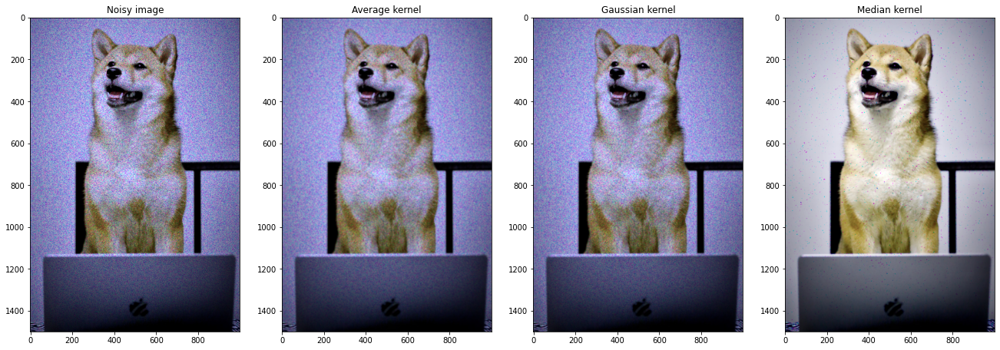

In [31]:
# Generate a noisy image
img_noise = noisy(dog_rgb,'s&p',0.2)
img_filtered_average = cv2.blur(img_noise,(5,5))
img_filtered_gaussian = cv2.GaussianBlur(img_noise,(5,5),0)
img_filtered_median = cv2.medianBlur(img_noise,5)

showInRow([img_noise, img_filtered_average, img_filtered_gaussian, img_filtered_median], 
          ["Noisy image", "Average kernel", "Gaussian kernel", "Median kernel"])

![How a median filter works](https://cdn-images-1.medium.com/max/1600/1*VyzJxDrLrC-OqkV5LHhjQQ.gif)

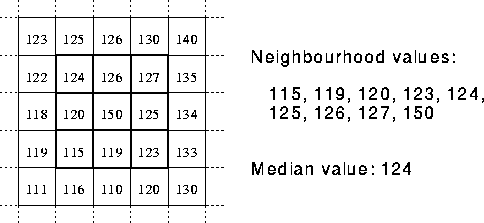

**Exercise**

c:\Users\markp\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\markp\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


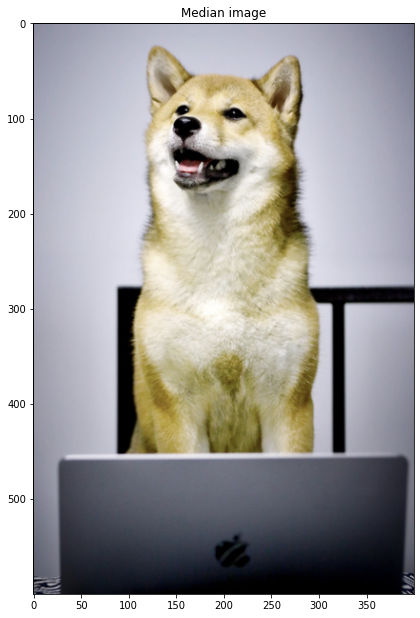

In [36]:
# Write your own median filter using numpy

def median_filter(image, kernel_size=5):
  image_padded = cv2.copyMakeBorder(image, 1, 1, 1, 1, cv2.BORDER_REFLECT)
  image_filtered = np.zeros_like(image)
  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      roi = image_padded[i-1:i+1,j-1:j+1]
      image_filtered[i, j] = np.median(roi, [0, 1])
  return image_filtered
  
  
dog_rgb_small = cv2.resize(dog_rgb, None, fx=.4, fy=.4, interpolation = cv2.INTER_CUBIC)
img_median = median_filter(dog_rgb_small)
plt.imshow(img_median)
plt.title('Median image')
plt.show()

### Kernel Operations
![nobody read this](https://www.pyimagesearch.com/wp-content/uploads/2016/06/convolutions_kernel_sliding.jpg)



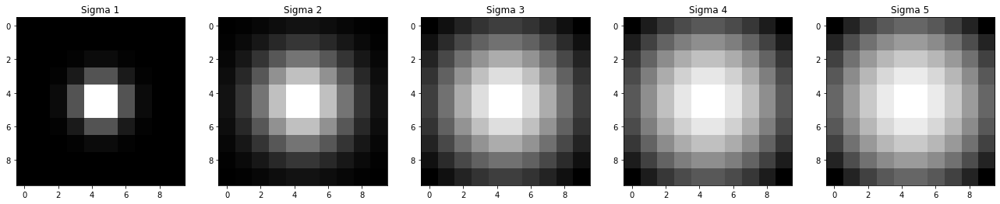

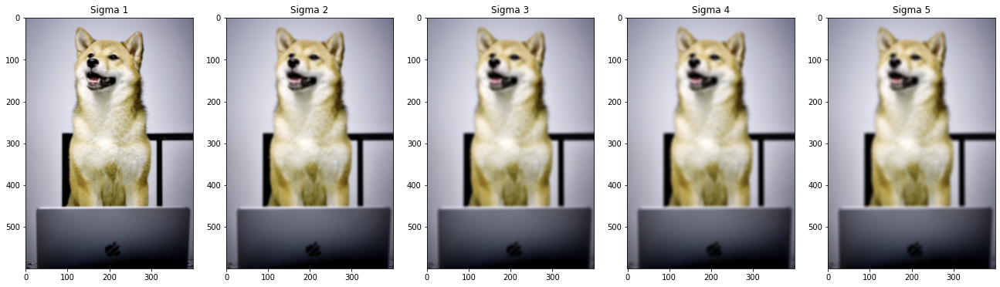

In [37]:
def getGaussKernel2d(ksize, sigma):
  kern = cv2.getGaussianKernel(ksize, sigma)
  return kern * np.transpose(kern)

max_sigma = 6
kernels = list(map(lambda x: getGaussKernel2d(10, x), range(1, max_sigma)))
kernels_titles = list(map(lambda x: "Sigma "+str(x), range(1, max_sigma)))

dog_rgb_small = cv2.resize(dog_rgb, None, fx=.4, fy=.4, interpolation = cv2.INTER_CUBIC)
dog = list(map(lambda kern: cv2.filter2D(dog_rgb_small, -1, kern), kernels))
# cv2.filter2D(): Convolves an image with the kernel.

showInRow(kernels, kernels_titles)
showInRow(dog, kernels_titles)


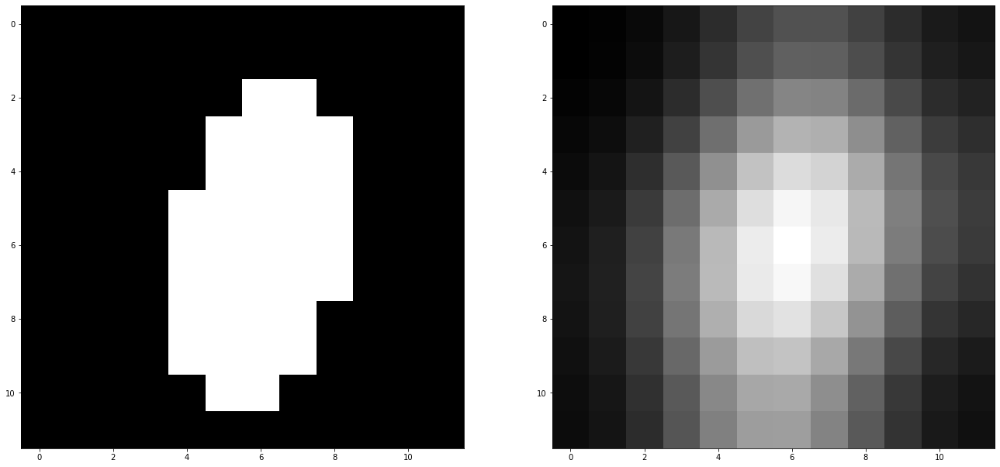

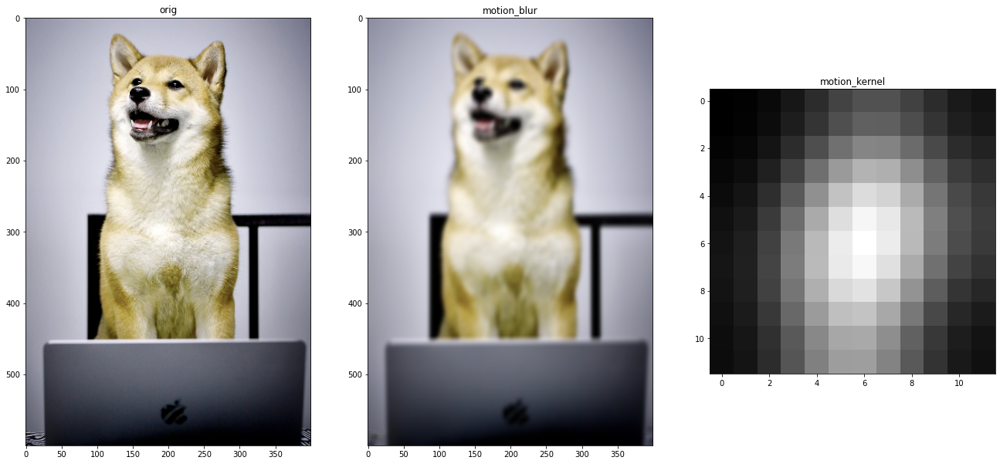

In [38]:
#@title Interactive Motion Blur { run: "auto" }
kernel_size = 12 #@param {type:"slider", min:6, max:50, step:2}
half_kernel_size = kernel_size // 2
angle = 282 #@param {type:"slider", min:0, max:360, step:1}

motion = np.zeros((kernel_size, kernel_size), dtype='float32')
cv2.ellipse(motion,(half_kernel_size,half_kernel_size),(half_kernel_size-2,2),angle,0,360,255,-1)

motion_blurred = cv2.GaussianBlur(motion, (0, 0), 2)
motion_blurred /= np.sum(motion_blurred)
showInRow([motion, motion_blurred])

blured_dog = cv2.filter2D(dog_rgb_small, -1, motion_blurred)

showInRow([dog_rgb_small, blured_dog, motion_blurred], 
         ['orig', 'motion_blur', 'motion_kernel'])
#
#GaussianBlur(): Blurs an image using a Gaussian filter.
#The function convolves the source image with the specified Gaussian kernel. 

For more info you can read this [tutorial](https://www.pyimagesearch.com/2016/07/25/convolutions-with-opencv-and-python/) and [the official documentation](https://docs.opencv.org/3.0-beta/modules/imgproc/doc/filtering.html).

# Geometric Operation

Matrix multiplication is a cool tool for performing some transformations. Let's try to rotate some points in space.

draw_points.shape:  (83, 2)


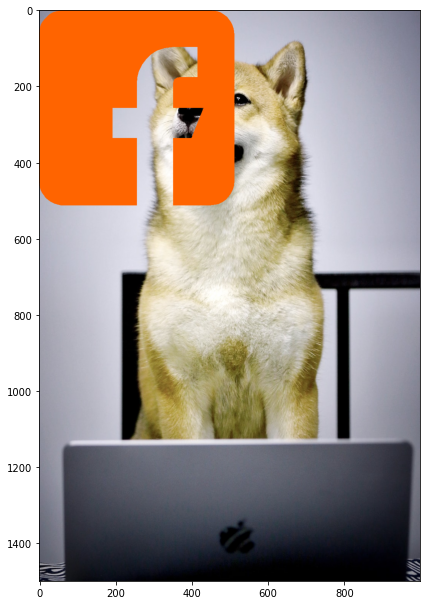

In [39]:
draw_img = dog_rgb.copy()
draw_points = np.array([448, 0, 64, 0, 56.799485, 0.402227294, 50.0464203, 1.53134588, 43.003465, 3.535751, 38.2365324, 5.41401396, 32.19104, 8.4756869, 26.4792023, 12.1766262, 20.8123088, 16.8037307, 14.0927529, 23.971363, 8.40905032, 32.3072094, 4.47882623, 40.4695357, 1.39670977, 50.6642979, 0, 64, 0, 448, 0.743796356, 457.768673, 2.25672551, 464.876462, 4.16563071, 470.724826, 6.23342586, 475.545309, 9.42605378, 481.407584, 12.7170411, 486.254256, 16.3860076, 490.727129, 20.2376443, 494.66354, 24.4347004, 498.276095, 28.4415747, 501.19292, 31.1849963, 502.933572, 37.0206819, 506.034075, 42.206129, 508.180702, 45.7706418, 509.357045, 49.3691605, 510.313646, 52.8231075, 511.023531, 58.1795408, 511.737777, 64, 512, 256, 512, 256, 336, 192, 336, 192, 256, 256, 256, 256, 192, 257.168188, 176.977863, 261.44511, 160.046241, 270.636521, 141.021392, 280.767887, 127.636945, 293.210926, 116.097677, 308.441704, 106.425887, 328.646761, 98.8597109, 352, 96, 416, 96, 416, 176, 384, 176, 370.885893, 176.039201, 363.640318, 176.804097, 356.932728, 179.552274, 354.021345, 182.825421, 352, 192, 352, 256, 432, 256, 400, 336, 352, 336, 352, 512, 448, 512, 462.205434, 510.411922, 468.771088, 508.542259, 475.791694, 505.647993, 482.645512, 501.793895, 489.632797, 496.574879, 496.698752, 489.488035, 502.197105, 482.013446, 506.120185, 474.794008, 508.843248, 467.874234, 511.129694, 458.558538, 512, 448, 512, 64, 510.128977, 48.6035328, 507.25648, 39.8128283, 502.76988, 30.9134767, 496.806058, 22.6380682, 492.9045, 18.4348894, 487.749432, 13.8696543, 479.388685, 8.2361349, 473.266573, 5.19723482, 467.246181, 2.95477855, 458.007097, 0.780911982], dtype='float32')
draw_points = draw_points.reshape((-1, 2))

# fillPoly requries dtype = 'int'
draw_points = np.round(draw_points).astype('int')

print("draw_points.shape: ", draw_points.shape)
cv2.fillPoly(draw_img, [draw_points], (255, 100, 0))
plt.imshow(draw_img)
plt.show()

# Affine Operation
$\textbf{x}'=\textbf{M}\textbf{x}$
where $\textbf{M}$ is the corrresponding matrix. $\textbf{x}\equiv[x,y,1]^\intercal, \textbf{x}'\equiv[x,y,1]^\intercal$

# Possible matrices used for Affine Transform
## Rotation matrix
\begin{bmatrix}
cos\theta & sin\theta & 0\\
sin\theta & cos\theta & 0\\
0 & 0 & 1 
\end{bmatrix}
##Shear Matrix
\begin{bmatrix}
1 & a & 0\\
0 & 1 & 0\\
0 & 0 & 1
\end{bmatrix}
##Scaling Matrix
\begin{bmatrix}
S_x & 0 & 0\\
0 & S_y & 0\\
0 & 0 & 1
\end{bmatrix}
##Translation Matrix
\begin{bmatrix}
1 & 0 & d_x\\
0 & 1 & d_y\\
0 & 0 & 1
\end{bmatrix}
## Sample Operation
If it is scaling matrix, the compenents are given by

$x'= S_x x$

$y' = S_y y$

Shape of rotated points: (1, 83, 2)


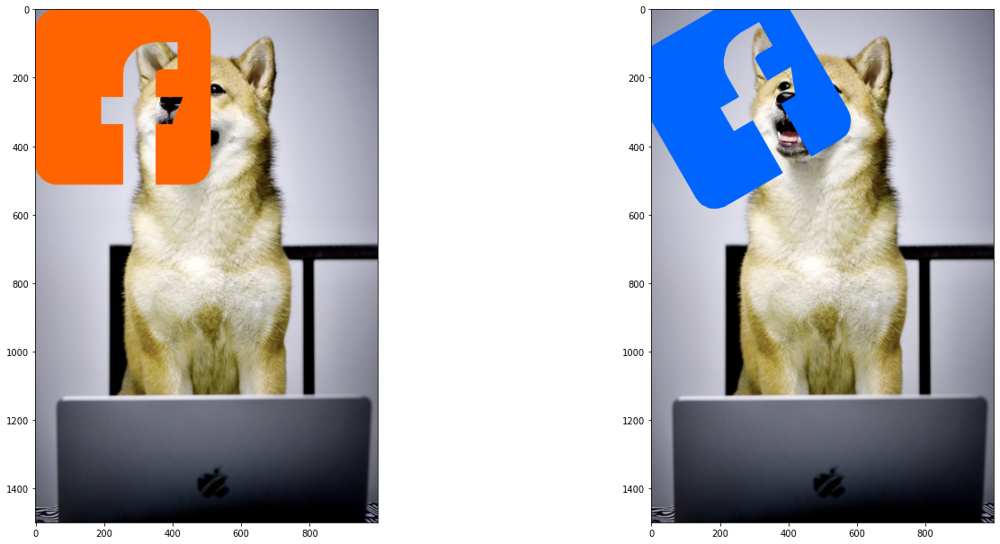

In [40]:
# cv2.getRotationMatrix2D(center_pos, angle_in_degree, scale)
M = cv2.getRotationMatrix2D((256,256),30,1)
draw_points2 = cv2.transform(np.array([draw_points], np.int32), M) # requires ndim=3, check https://docs.opencv.org/3.4/d2/de8/group__core__array.html#ga393164aa54bb9169ce0a8cc44e08ff22
print("Shape of rotated points:", draw_points2.shape)
draw_img2 = dog_rgb.copy()

cv2.fillPoly(draw_img2, draw_points2, (0, 100, 255))
showInRow([draw_img, draw_img2])

In [41]:
# Let's see what's inside the rotation matrix

print("Rotation with translation:\n", M)
print("\nPure rotation:\n",cv2.getRotationMatrix2D((0,0), 30, 1))
print("\nScaling:\n",cv2.getRotationMatrix2D((0,0), 0, 2))
print("\nRotation with zero scale:\n",cv2.getRotationMatrix2D((0,0), 30, 0))

Rotation with translation:
 [[  0.8660254    0.5        -93.70250337]
 [ -0.5          0.8660254  162.29749663]]

Pure rotation:
 [[ 0.8660254  0.5        0.       ]
 [-0.5        0.8660254  0.       ]]

Scaling:
 [[ 2.  0. -0.]
 [-0.  2.  0.]]

Rotation with zero scale:
 [[ 0.  0.  0.]
 [-0.  0.  0.]]


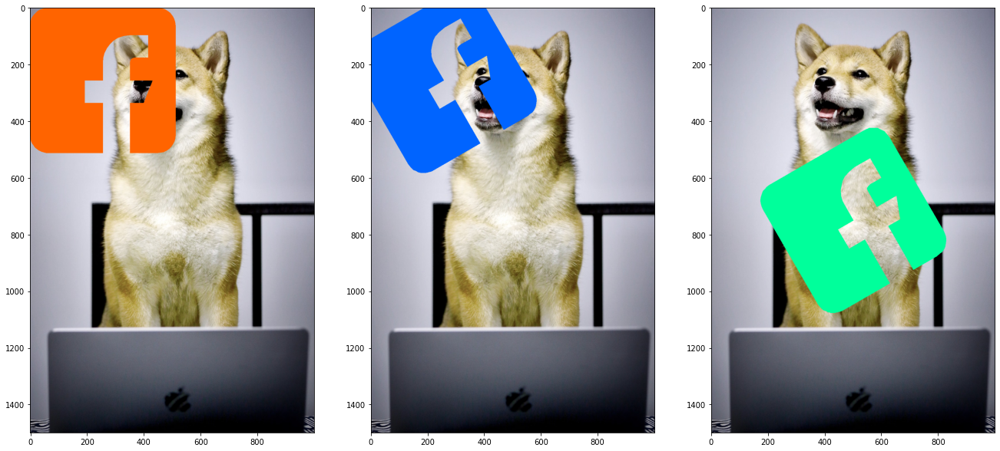

In [42]:
# Let's combine several transforms together

dog_center = dog_rgb.shape[:2]
dog_center = (dog_center[0] / 2, dog_center[1] / 2)
M_translate = np.float32([[1,0,dog_center[1] - 256],
                          [0,1,dog_center[0] - 256]]) # there is no opencv function for translation

M_rotate = M.copy()
draw_points3 = cv2.transform(np.array([draw_points], np.int32), M_rotate) # requires ndim=3
draw_points3 = cv2.transform(np.array(draw_points3, np.int32), M_translate) # requires ndim=3

draw_img3 = dog_rgb.copy()

cv2.fillPoly(draw_img3, draw_points3, (0, 255, 155))
showInRow([draw_img, draw_img2, draw_img3])

This is not the most elegant way for performing multiple operations in sequence. Using transformation matrices, we can translate and rotate points in one single operation.

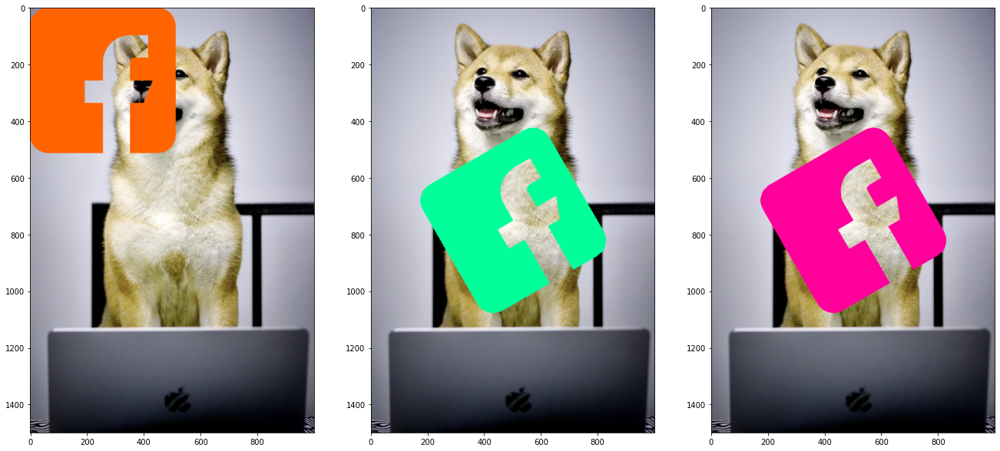

In [43]:
def combineAffine(a, b):
  aa = np.vstack((a,[0, 0, 1]))
  bb = np.vstack((b,[0, 0, 1]))
  return np.dot(aa, bb)[:2]

M_combined = combineAffine(M_translate,M_rotate)

draw_points4 = cv2.transform(np.array([draw_points], np.int32), M_combined) # requeries ndim=3
draw_img4 = dog_rgb.copy()

cv2.fillPoly(draw_img4, draw_points4, (255, 0, 155))
showInRow([draw_img, draw_img3, draw_img4])

# It seems that we get wrong positions of points -> change order of transformations and explain why

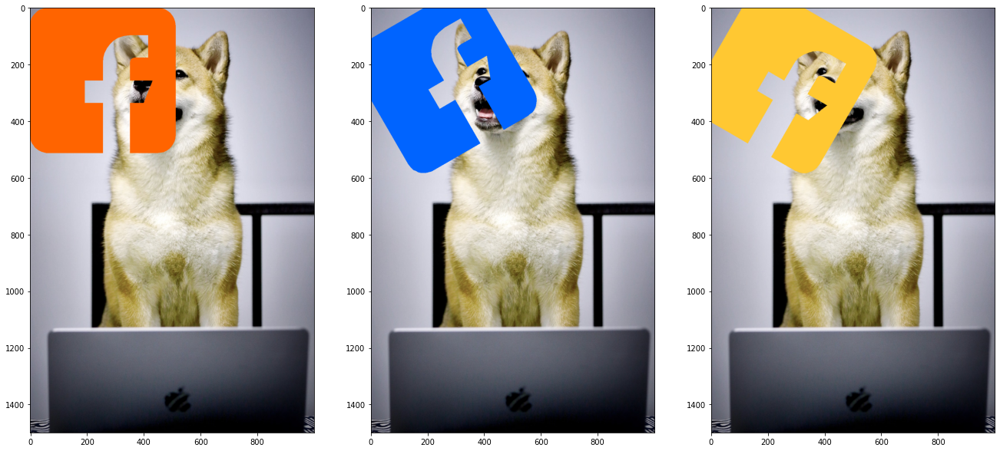

In [44]:
# We can also invert transformations
M_rotate_inv = cv2.invertAffineTransform(M_rotate)
draw_points5 = cv2.transform(np.array([draw_points], np.int32), M_rotate_inv) # requeries ndim=3
draw_img5 = dog_rgb.copy()

cv2.fillPoly(draw_img5, draw_points5, (255, 200, 50))
showInRow([draw_img, draw_img2, draw_img5])

### Exercise
Place the logo on the bottom right corner of the dog image and scale it to half it's size (size of the logo is (512, 512)). If it is easy for you, additionally rotate the logo by 180º.

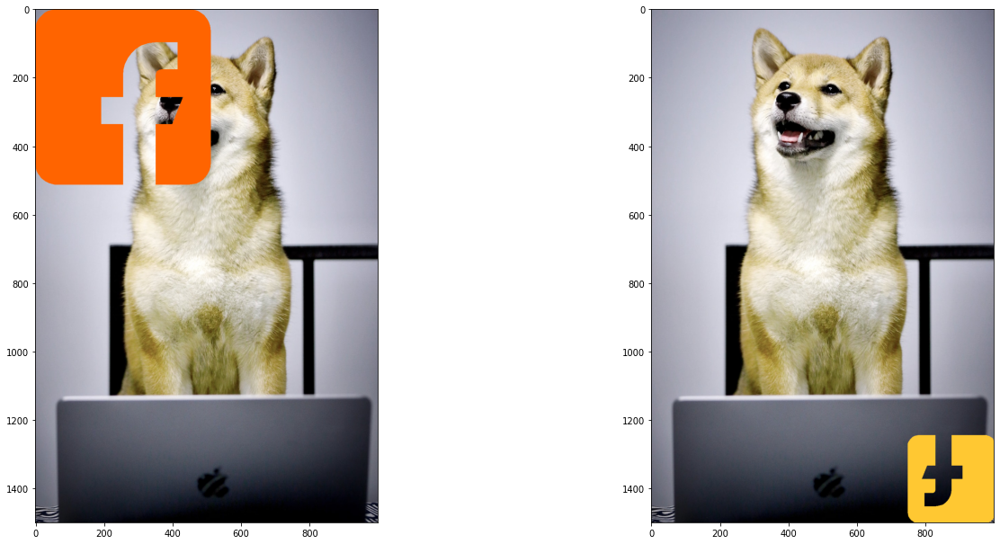

In [60]:
M = cv2.getRotationMatrix2D((670, 1000),180,1/2)

draw_points6 = cv2.transform(np.array([draw_points], np.int32), M)
draw_img6 = dog_rgb.copy()

cv2.fillPoly(draw_img6, draw_points6, (255, 200, 50))
showInRow([draw_img, draw_img6])

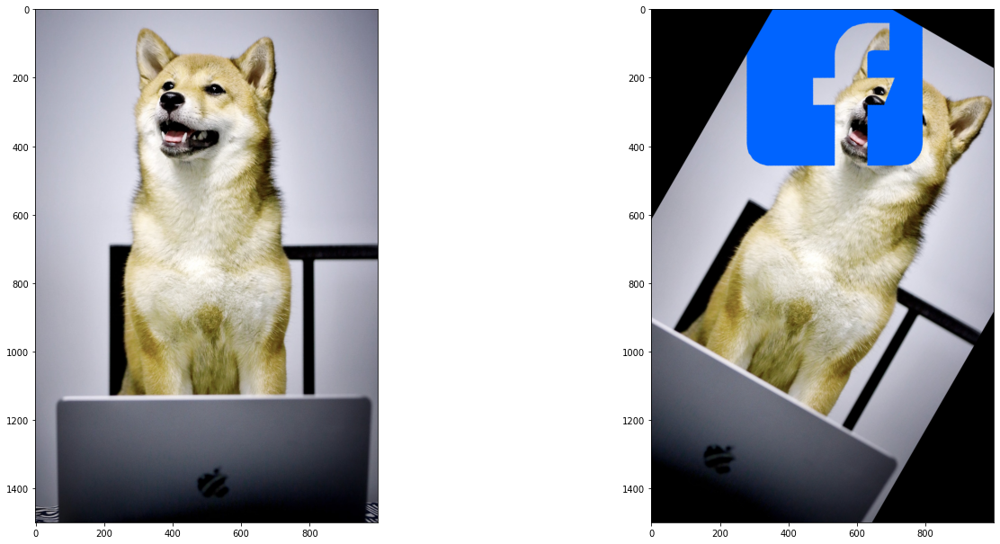

In [ ]:
# This also works with images
M = cv2.getRotationMatrix2D((draw_img2.shape[1]/2, draw_img2.shape[0]/2), -30, 1)
dog_rgb_rotated = cv2.warpAffine(draw_img2, M, (draw_img2.shape[1], draw_img2.shape[0]))

showInRow([dog_rgb, dog_rgb_rotated])